In [1]:
pip install segment-anything-py

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.5/40.5 kB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.1 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 80.5 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 52.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 28.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.5 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.1 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 27.8 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 12.4 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 7.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 66.7 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall: nv

In [2]:
!wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

--2025-11-15 01:39:16--  https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 13.225.143.109, 13.225.143.99, 13.225.143.54, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|13.225.143.109|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2564550879 (2.4G) [binary/octet-stream]
Saving to: ‘sam_vit_h_4b8939.pth’

sam_vit_h_4b8939.pt 100%[===================>]   2.39G   207MB/s    in 11s     

2025-11-15 01:39:28 (220 MB/s) - ‘sam_vit_h_4b8939.pth’ saved [2564550879/2564550879]



In [3]:
pip install rasterio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 41.9 MB/s eta 0:00:0000:0100:01m
Note: you may need to restart the kernel to use updated packages.


In [4]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
import cv2
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor
import json
from PIL import Image
import os
import torch
import torch.nn as nn
import torch.nn.functional as F

In [5]:
dataset_path_rgn = "/kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan"
number_to_load_rgn = ['417708', '417709', '417710', '417711', '417712', '417713', '417714', '417715', '417716', '417717', '417718', '417719']

images_paths = []
masks_paths = []

images_dir = os.path.join(dataset_path_rgn, 'image')
masks_dir = os.path.join(dataset_path_rgn, 'mask')

for numb_name in number_to_load_rgn:
    images_dir = os.path.join(dataset_path_rgn, 'image', numb_name)
    masks_dir = os.path.join(dataset_path_rgn, 'mask', numb_name)
    if os.path.isdir(images_dir) and os.path.isdir(masks_dir):
        image_path = sorted([os.path.join(images_dir, f) for f in os.listdir(images_dir) if f.endswith('.tif')])
        mask_path = sorted([os.path.join(masks_dir, f) for f in os.listdir(masks_dir) if f.endswith('.tif')])
        
        images_paths.extend(image_path)
        masks_paths.extend(mask_path)

In [6]:
from sklearn.model_selection import train_test_split

image_train, image_test, mask_train, mask_test = train_test_split(
    images_paths, masks_paths, test_size = 0.2, random_state = 84 
)

image_test, image_val, mask_test, mask_val = train_test_split(
    image_test, mask_test, test_size = 0.5, random_state = 84 
)

In [7]:
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2
from torchvision.transforms import ToTensor

train_transform = A.Compose([
    A.HorizontalFlip(p = 0.5),
    A.VerticalFlip(p = 0.5),
    A.RandomRotate90(p = 0.5),
    A.RandomBrightnessContrast(p = 0.5),
    A.MedianBlur(blur_limit = 5, p = 0.5),
    A.GaussNoise(std_range = (0.01, 0.05), p = 0.5),
    ToTensorV2()
])

test_transform = A.Compose([
    ToTensorV2()
])

val_transform = A.Compose([
    ToTensorV2()
])

def remove_outliers_img(image_array, lower_value = 1, upper_value = 99):
    stretched = np.zeros_like(image_array, dtype = np.float32)

    for i in range(image_array.shape[2]):
        band = image_array[:, :, i].astype(np.float32)
        lower_limit = np.percentile(band, lower_value)
        upper_limit = np.percentile(band, upper_value)

        if upper_limit - lower_limit < 1e-6:
            stretched[:, :, i] = band
        else:
            stretched[:, :, i] = np.clip((band - lower_limit) / (upper_limit - lower_limit) * 255.0, 0, 255)

    return stretched.astype(np.uint8)

class SegmentDataset(Dataset):
    def __init__(self, image_paths, mask_paths, transform = None, apply_remove_outliers = True):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.transform = transform
        self.apply_remove_outliers = apply_remove_outliers

    def __len__(self):
        return len(self.image_paths)

    def normalize(self, image, mask):
        image = (image - image.min()) / (image.max() - image.min() + 1e-8) 
        mask = (mask > 0.5).float()  
        return image, mask
    
    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        mask_path = self.mask_paths[idx]

        image = np.array(Image.open(image_path).convert("RGB"))
        mask = np.array(Image.open(mask_path).convert("L"))

        if self.apply_remove_outliers:
            image = remove_outliers_img(image)

        if self.transform:    
            augmented = self.transform(image = image, mask = mask)
            image = augmented["image"]
            mask = augmented["mask"]
        else:
            image = torch.tensor(image).permute(2, 0, 1) / 255.0
            mask = torch.tensor(mask)
        
        mask = (mask > 0.5).float()
        mask = mask.unsqueeze(0).float()

        image, mask = self.normalize(image, mask)

        return image, mask, image_path, mask_path

In [8]:
train_dataset = SegmentDataset(image_train, mask_train, transform = train_transform)
train_loader = DataLoader(train_dataset, batch_size = 1, num_workers = 1, pin_memory = False, shuffle = True)

test_dataset = SegmentDataset(image_test, mask_test, transform = test_transform)
test_loader = DataLoader(test_dataset, batch_size = 1, num_workers = 1, pin_memory = False, shuffle = False)

val_dataset = SegmentDataset(image_val, mask_val, transform = val_transform)
val_loader = DataLoader(val_dataset, batch_size = 1, num_workers = 1, pin_memory = False, shuffle = False)

In [9]:
train_size = len(train_dataset)
val_size = len(val_dataset)
test_size = len(test_dataset)

print(f"Train size: {train_size}")
print(f"Validation size: {val_size}")
print(f"Test size: {test_size}")

Train size: 144
Validation size: 18
Test size: 18


In [10]:
image_train, mask_train, img_path_train, mask_path_train = train_dataset[0]
print(image_train)
print(image_train.shape)

tensor([[[0.0000, 0.0000, 0.0000,  ..., 0.0474, 0.0172, 0.0043],
         [0.0000, 0.0000, 0.0000,  ..., 0.0431, 0.0043, 0.0000],
         [0.0000, 0.0000, 0.0043,  ..., 0.0000, 0.0000, 0.0345],
         ...,
         [0.2155, 0.1983, 0.2284,  ..., 0.2457, 0.3836, 0.3793],
         [0.1983, 0.2284, 0.2586,  ..., 0.3578, 0.4612, 0.3966],
         [0.1810, 0.2414, 0.2241,  ..., 0.2716, 0.4914, 0.4267]],

        [[0.0129, 0.0345, 0.0086,  ..., 0.0302, 0.0000, 0.0216],
         [0.0000, 0.0000, 0.0086,  ..., 0.0474, 0.0086, 0.0086],
         [0.0129, 0.0000, 0.0302,  ..., 0.0000, 0.0000, 0.0000],
         ...,
         [0.0517, 0.0690, 0.0302,  ..., 0.2155, 0.3319, 0.3319],
         [0.0431, 0.0603, 0.0431,  ..., 0.3060, 0.4784, 0.3534],
         [0.0431, 0.0560, 0.0819,  ..., 0.2026, 0.4569, 0.3664]],

        [[0.0043, 0.0216, 0.0043,  ..., 0.0043, 0.0043, 0.0000],
         [0.0000, 0.0086, 0.0345,  ..., 0.0000, 0.0000, 0.0000],
         [0.0129, 0.0000, 0.0000,  ..., 0.0000, 0.0302, 0.

In [11]:
print(mask_train)
print(mask_train.shape)

tensor([[[1., 1., 1.,  ..., 1., 1., 0.],
         [1., 1., 1.,  ..., 1., 1., 0.],
         [1., 1., 1.,  ..., 1., 1., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]]])
torch.Size([1, 256, 256])


In [12]:
image_test, mask_test, img_path_test, mask_path_test = test_dataset[0]
print(image_test)
print(image_test.shape)

tensor([[[0.1529, 0.1216, 0.1176,  ..., 0.3804, 0.4588, 0.1725],
         [0.2392, 0.2118, 0.1922,  ..., 0.2941, 0.2745, 0.1333],
         [0.2745, 0.2549, 0.2314,  ..., 0.1059, 0.1412, 0.2353],
         ...,
         [0.7961, 0.8000, 0.8118,  ..., 0.2706, 0.2588, 0.0863],
         [0.7961, 0.8000, 0.8039,  ..., 0.0667, 0.0627, 0.1020],
         [0.7882, 0.7961, 0.8000,  ..., 0.0392, 0.0000, 0.0627]],

        [[0.1137, 0.0824, 0.0784,  ..., 0.3490, 0.4431, 0.1412],
         [0.2078, 0.1765, 0.1569,  ..., 0.2745, 0.2510, 0.1098],
         [0.2510, 0.2275, 0.2039,  ..., 0.0824, 0.1176, 0.2353],
         ...,
         [0.7765, 0.7843, 0.7922,  ..., 0.2667, 0.2549, 0.0706],
         [0.7765, 0.7843, 0.7882,  ..., 0.0510, 0.0392, 0.0824],
         [0.7725, 0.7765, 0.7843,  ..., 0.0196, 0.0000, 0.0392]],

        [[0.1137, 0.0824, 0.0784,  ..., 0.3961, 0.5020, 0.1922],
         [0.2078, 0.1765, 0.1569,  ..., 0.3137, 0.3059, 0.1569],
         [0.2353, 0.2157, 0.1882,  ..., 0.1216, 0.1686, 0.

In [13]:
print(mask_test)
print(mask_test.shape)

tensor([[[1., 1., 1.,  ..., 0., 0., 0.],
         [1., 1., 1.,  ..., 0., 0., 0.],
         [1., 1., 1.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]]])
torch.Size([1, 256, 256])


In [14]:
image_val, mask_val, img_path_val, mask_path_val = val_dataset[0]
print(image_val)
print(image_val.shape)

tensor([[[0.4314, 0.3490, 0.3098,  ..., 0.1608, 0.2431, 0.2510],
         [0.3333, 0.4000, 0.2275,  ..., 0.1490, 0.1686, 0.1333],
         [0.3490, 0.4980, 0.2980,  ..., 0.2157, 0.1922, 0.1490],
         ...,
         [0.2078, 0.2157, 0.2078,  ..., 0.3804, 0.4980, 0.3922],
         [0.1922, 0.2078, 0.2078,  ..., 0.5725, 0.5216, 0.4549],
         [0.1843, 0.2000, 0.2078,  ..., 0.3843, 0.5294, 0.5490]],

        [[0.4235, 0.3294, 0.2784,  ..., 0.1843, 0.2784, 0.2863],
         [0.3098, 0.3882, 0.1843,  ..., 0.1686, 0.1922, 0.1490],
         [0.3294, 0.4980, 0.2706,  ..., 0.2431, 0.2196, 0.1686],
         ...,
         [0.2275, 0.2353, 0.2275,  ..., 0.4118, 0.5059, 0.3882],
         [0.2118, 0.2275, 0.2275,  ..., 0.6353, 0.5333, 0.4549],
         [0.2000, 0.2196, 0.2275,  ..., 0.4235, 0.5412, 0.5647]],

        [[0.4078, 0.3098, 0.2431,  ..., 0.1882, 0.2863, 0.2941],
         [0.2941, 0.3725, 0.1451,  ..., 0.1725, 0.2000, 0.1529],
         [0.3098, 0.4863, 0.2510,  ..., 0.2510, 0.2235, 0.

In [15]:
print(mask_val)
print(mask_val.shape)

tensor([[[0., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 0., 1.,  ..., 1., 1., 1.],
         ...,
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.]]])
torch.Size([1, 256, 256])


In [16]:
for i, (image, mask, img_path, mask_path) in enumerate(train_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

Empty mask found at index 38


In [17]:
for i, (image, mask, img_path, mask_path) in enumerate(test_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

In [18]:
for i, (image, mask, img_path, mask_path) in enumerate(val_dataset):
    if mask.sum() == 0:
        print(f"Empty mask found at index {i}")

In [19]:
for img_path, mask_path in zip(images_paths[:5], masks_paths[:5]):
    print(f"Image: {os.path.basename(img_path)} - Mask: {os.path.basename(mask_path)}")

Image: 271333.tif - Mask: 271333_mask.tif
Image: 271334.tif - Mask: 271334_mask.tif
Image: 271335.tif - Mask: 271335_mask.tif
Image: 271336.tif - Mask: 271336_mask.tif
Image: 271337.tif - Mask: 271337_mask.tif


In [20]:
for image, mask, img_path, mask_path in train_loader:
    print("image shape:", image.shape) 
    print("mask shape:", mask.shape)

image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
imag

In [21]:
for image, mask, img_path, mask_path in test_loader:
    print("image shape:", image.shape) 
    print("mask shape:", mask.shape)

image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
imag

In [22]:
for image, mask, img_path, mask_path in val_loader:
    print("image shape:", image.shape)
    print("mask shape:", mask.shape)

image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
image shape: torch.Size([1, 3, 256, 256])
mask shape: torch.Size([1, 1, 256, 256])
imag

In [23]:
def calculate_pos_weight(dataloader, device):
    total_pos, total_neg = 0, 0
    for batch in dataloader:
        masks = batch[1].to(device)   
        total_pos += (masks == 1).sum().item()
        total_neg += (masks == 0).sum().item()
    pos_weight = total_neg / (total_pos + 1e-6)
    return torch.tensor(pos_weight, device=device)

In [24]:
class DiceFocalLoss(nn.Module):
    def __init__(self, dice_weight, focal_weight, alpha = 0.25, gamma = 2.0):
        super(DiceFocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.dice_weight = dice_weight
        self.focal_weight = focal_weight

    def forward(self, inputs, targets, smooth = 1e-6):
        bce_loss = F.binary_cross_entropy_with_logits(inputs, targets, reduction = "none")
        pt = torch.exp(-bce_loss)
        focal_loss = (self.alpha * (1 - pt) ** self.gamma * bce_loss).mean()

        probs = torch.sigmoid(inputs)
        probs = probs.contiguous().view(probs.shape[0], -1)
        targets = targets.contiguous().view(targets.shape[0], -1)

        intersection = (probs * targets).sum(dim = 1)
        dice_score = (2.0 * intersection + smooth) / (probs.sum(dim = 1) + targets.sum(dim = 1) + smooth)
        dice_loss = 1 - dice_score.mean()

        loss = self.dice_weight * dice_loss + self.focal_weight * focal_loss
        return loss

In [25]:
def calc_iou(pred_mask, gt_mask, smooth = 1e-6):
    pred_mask = torch.sigmoid(pred_mask.detach())
    pred_mask = (pred_mask > 0.5).float()

    gt_mask = (gt_mask.detach() > 0).float()

    if pred_mask.dim() == 3:
        pred_mask = pred_mask.unsqueeze(1)
    if gt_mask.dim() == 3:
        gt_mask = gt_mask.unsqueeze(1)

    batch_size = pred_mask.shape[0]
    iou_list = []

    for i in range(batch_size):
        gt = gt_mask[i]
        pred = pred_mask[i]

        intersect = (pred * gt).sum()
        union = pred.sum() + gt.sum() - intersect

        if gt.sum() == 0:
            if pred.sum() == 0:
                iou = 1.0  
            else:
                iou = 0.0  
        else:
            iou = (intersect + smooth) / (union + smooth)

        iou_list.append(iou)

    return torch.tensor(iou_list).mean().item()

In [26]:
from torchvision.ops import masks_to_boxes

def box_from_mask(mask):
    orig_shape = mask.shape 

    if mask.dim() == 4 and mask.shape[1] == 1:
        mask = mask.squeeze(1) 

    bin_mask = mask > 0.5 

    valid_mask = []
    for m in bin_mask:
        if m.sum() == 0:
            valid_mask.append(m.new_zeros(m.shape))
        else:
            valid_mask.append(m)

    valid_mask = torch.stack(valid_mask)

    if valid_mask.sum() == 0:
        B, C, H, W = orig_shape
        box = torch.tensor([[[0, 0, W, H]] for _ in range(B)], device = mask.device)
    else:
        box = masks_to_boxes(valid_mask)
        if box.numel() == 0: 
            B, C, H, W = orig_shape
            box = torch.tensor([[[0, 0, W, H]] for _ in range(B)], device = mask.device)
        else:
            box = box.unsqueeze(1)

    return box

In [27]:
def preprocess_image(images, transform, device):
    process_images = []
    for img in images:
        img = img.permute(1, 2, 0).cpu().numpy()
        img_resize = transform.apply_image(img)
        img_resize = torch.as_tensor(img_resize, dtype = torch.float32).permute(2, 0, 1) / 255.0
        process_images.append(img_resize)
    return torch.stack(process_images).to(device)

In [28]:
!pip install optuna

In [29]:
import torch.optim as optim
from torch.optim.lr_scheduler import StepLR, CosineAnnealingLR, ReduceLROnPlateau
import optuna
from tqdm import tqdm
import warnings
from segment_anything.utils.transforms import ResizeLongestSide

device = "cuda" if torch.cuda.is_available() else "cpu"

warnings.filterwarnings("ignore")

def train_model(model, train_loader, val_loader, transform, device, scheduler_type, dice_weight, focal_weight):
    criterion = DiceFocalLoss(dice_weight = dice_weight, focal_weight = focal_weight)
    optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr = 0.0001)

    num_epoch = 25
    
    if scheduler_type == "steplr":
        scheduler = StepLR(optimizer, step_size = 5, gamma = 0.5)
    elif scheduler_type == "reducelr":
        scheduler = ReduceLROnPlateau(optimizer, mode = 'min', factor = 0.5, patience = 5)
    else:
        scheduler = CosineAnnealingLR(optimizer, T_max = num_epoch)

    patience = 10
    best_val_loss = float('inf')
    trigger = 0
    best_model = None

    for epoch in range(num_epoch):
        model.train()
        total_loss = 0
        total_iou = 0
        num_batches = 0

        for images, masks, _, _ in tqdm(train_loader):
            images = preprocess_image(images, transform, device)
            masks = masks.to(device)

            optimizer.zero_grad()
            image_embeddings = model.image_encoder(images)
            box = box_from_mask(masks).to(device)

            sparse_embeddings, dense_embeddings = model.prompt_encoder(points = None, boxes = box, masks = None)
            low_res_masks, _ = model.mask_decoder(
                image_embeddings = image_embeddings,
                image_pe = model.prompt_encoder.get_dense_pe(),
                sparse_prompt_embeddings = sparse_embeddings,
                dense_prompt_embeddings = dense_embeddings,
                multimask_output = False
            )

            preds = torch.sigmoid(low_res_masks)
            masks_resized = F.interpolate(masks, size = preds.shape[-2:], mode = "bilinear", align_corners = False)
            masks_resized = (masks_resized > 0.5).float()

            loss = criterion(preds, masks_resized)
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            total_iou += calc_iou(preds, masks_resized)
            num_batches += 1

        avg_loss = total_loss / num_batches
        avg_iou = total_iou / num_batches
        
        print(f"Epoch {epoch+1}/{num_epoch}")
        print(f"Train loss: {avg_loss}, Train Avg IoU: {avg_iou}\n")
        
        model.eval()
        val_total_loss = 0
        val_total_iou = 0
        val_num_batches = 0

        with torch.no_grad():
            for val_images, val_masks, _, _ in tqdm(val_loader):
                val_images = preprocess_image(val_images, transform, device)
                val_masks = val_masks.to(device)

                val_embeddings = model.image_encoder(val_images)
                val_box = box_from_mask(val_masks).to(device)
                val_sparse_embeddings, val_dense_embeddings = model.prompt_encoder(points = None, boxes = val_box, masks = None)

                val_low_res_masks, _ = model.mask_decoder(
                    image_embeddings = val_embeddings,
                    image_pe = model.prompt_encoder.get_dense_pe(),
                    sparse_prompt_embeddings = val_sparse_embeddings,
                    dense_prompt_embeddings = val_dense_embeddings,
                    multimask_output = False
                )

                val_preds = torch.sigmoid(val_low_res_masks)
                val_masks_resized = F.interpolate(val_masks, size = val_preds.shape[-2:], mode = "bilinear", align_corners = False)
                val_masks_resized = (val_masks_resized > 0.5).float()

                val_loss = criterion(val_preds, val_masks_resized)
                val_total_loss += val_loss.item()
                val_total_iou += calc_iou(val_preds, val_masks_resized)
                val_num_batches += 1

        val_avg_loss = val_total_loss / val_num_batches
        val_avg_iou = val_total_iou / val_num_batches

        if isinstance(scheduler, ReduceLROnPlateau):
            scheduler.step(val_avg_loss)
        else:
            scheduler.step()
        
        print(f"Val loss: {val_avg_loss}, Val Avg IoU: {val_avg_iou}\n")

        if val_avg_loss < best_val_loss:
            best_val_loss = val_avg_loss
            best_model = model
            trigger = 0
        else:
            trigger += 1

        if trigger >= patience:
            print(f"Stop at epoch {epoch+1}")
            break

    return best_model, best_val_loss

In [30]:
import gc

fine_tune_sam_model = None

def objective(trial):
    global fine_tune_sam_model
    torch.cuda.empty_cache()
    gc.collect()
    
    scheduler = trial.suggest_categorical("scheduler", ["steplr", "reducelr", "cosine"])
    dice_weight, focal_weight = trial.suggest_categorical("loss_weight", [(0.3, 0.7), (0.2, 0.8)])

    sam_model = sam_model_registry["vit_h"](checkpoint = "sam_vit_h_4b8939.pth").to(device)

    for name, param in sam_model.named_parameters():
        param.requires_grad = False
        if "mask_decoder" in name or "prompt_encoder" in name:
            param.requires_grad = True
    
    print(f"====================================================")
    print(f"Trial {trial.number}: scheduler = {scheduler}, dice weight = {dice_weight}, focal weight = {focal_weight}\n")
    
    transform = ResizeLongestSide(sam_model.image_encoder.img_size)

    model, val_loss = train_model(
        model = sam_model,
        train_loader = train_loader,
        val_loader = val_loader,
        transform = transform,
        device = device,
        scheduler_type = scheduler,
        dice_weight = dice_weight,
        focal_weight = focal_weight
    )

    if not hasattr(objective, "best_loss") or val_loss < objective.best_loss:
        objective.best_loss = val_loss
        fine_tune_sam_model = model

    torch.cuda.empty_cache()
    gc.collect()
    
    return val_loss

In [31]:
from optuna.samplers import GridSampler

search_space = {
    "scheduler": ["steplr", "reducelr", "cosine"],
    "loss_weight": [(0.3, 0.7), (0.2, 0.8)]
}

sampler = GridSampler(search_space)
study = optuna.create_study(direction = "minimize", sampler = sampler)
study.optimize(objective, n_trials = 6)

[I 2025-11-15 01:40:04,693] A new study created in memory with name: no-name-64bcf5c5-1d8a-4e5e-be32-716f073e6eba


Trial 0: scheduler = cosine, dice weight = 0.2, focal weight = 0.8



100%|██████████| 144/144 [02:46<00:00,  1.15s/it]


Epoch 1/25
Train loss: 0.1317016415608426, Train Avg IoU: 0.4649033084925678



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.11492668133642939, Val Avg IoU: 0.5394089888367388



100%|██████████| 144/144 [02:45<00:00,  1.15s/it]


Epoch 2/25
Train loss: 0.11590440886923009, Train Avg IoU: 0.5199628770739461



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.11455168264607589, Val Avg IoU: 0.5335330930021074



100%|██████████| 144/144 [02:45<00:00,  1.15s/it]


Epoch 3/25
Train loss: 0.11525403175296055, Train Avg IoU: 0.5439147531546445



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.11233741293350856, Val Avg IoU: 0.5842830480800735



100%|██████████| 144/144 [02:44<00:00,  1.15s/it]


Epoch 4/25
Train loss: 0.11547397723835376, Train Avg IoU: 0.5563914140867483



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.11616997420787811, Val Avg IoU: 0.5971633816758791



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 5/25
Train loss: 0.113823552771161, Train Avg IoU: 0.5431440257286044



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.11234931689169672, Val Avg IoU: 0.5477353504134549



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 6/25
Train loss: 0.11449991766777304, Train Avg IoU: 0.5810076870400694



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.11059550320108731, Val Avg IoU: 0.591096591618326



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 7/25
Train loss: 0.11306736426841882, Train Avg IoU: 0.5752874011070364



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.11053939825958675, Val Avg IoU: 0.579054077466329



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 8/25
Train loss: 0.11311325624895592, Train Avg IoU: 0.587757584244375



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.1138494016809596, Val Avg IoU: 0.6232408409317335



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 9/25
Train loss: 0.11369724305243128, Train Avg IoU: 0.600889541208744



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.11010938986308044, Val Avg IoU: 0.5507130349675814



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 10/25
Train loss: 0.1133108434215602, Train Avg IoU: 0.6130660510518484



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.11013244320121077, Val Avg IoU: 0.5971573309765922



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 11/25
Train loss: 0.11231395819534858, Train Avg IoU: 0.6072065220990529



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.11168999266293314, Val Avg IoU: 0.5951865878370073



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 12/25
Train loss: 0.11299854739465648, Train Avg IoU: 0.5958661178333892



100%|██████████| 18/18 [00:20<00:00,  1.12s/it]


Val loss: 0.11067477862040202, Val Avg IoU: 0.5758401242395242



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 13/25
Train loss: 0.11165947826682693, Train Avg IoU: 0.6057792092776961



100%|██████████| 18/18 [00:20<00:00,  1.12s/it]


Val loss: 0.11026476075251897, Val Avg IoU: 0.6397931824127833



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 14/25
Train loss: 0.11216979339304897, Train Avg IoU: 0.6327130227453179



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.1102814409467909, Val Avg IoU: 0.6145240159498321



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 15/25
Train loss: 0.11196307147232194, Train Avg IoU: 0.6261319196783006



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.11129624272386233, Val Avg IoU: 0.5981055754754279



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 16/25
Train loss: 0.11171240134475131, Train Avg IoU: 0.6321756023292741



100%|██████████| 18/18 [00:20<00:00,  1.12s/it]


Val loss: 0.11129593000643784, Val Avg IoU: 0.6142045805851618



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 17/25
Train loss: 0.11124275585946937, Train Avg IoU: 0.6372035338232914



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.11029908599125014, Val Avg IoU: 0.6033657499485545



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 18/25
Train loss: 0.11123510049138632, Train Avg IoU: 0.6367879993178778



100%|██████████| 18/18 [00:20<00:00,  1.12s/it]


Val loss: 0.11013076019783814, Val Avg IoU: 0.6282864511013031



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 19/25
Train loss: 0.11113818408921361, Train Avg IoU: 0.6273826825328999



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]
[I 2025-11-15 02:38:38,962] Trial 0 finished with value: 0.11010938986308044 and parameters: {'scheduler': 'cosine', 'loss_weight': (0.2, 0.8)}. Best is trial 0 with value: 0.11010938986308044.


Val loss: 0.11023790472083622, Val Avg IoU: 0.6010257742471166

Stop at epoch 19
Trial 1: scheduler = cosine, dice weight = 0.3, focal weight = 0.7



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 1/25
Train loss: 0.16621530795883802, Train Avg IoU: 0.519605992659409



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.15655720482269922, Val Avg IoU: 0.6017371093233427



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 2/25
Train loss: 0.1583920770531727, Train Avg IoU: 0.5461150575429201



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.15139084433515868, Val Avg IoU: 0.6023268430597253



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 3/25
Train loss: 0.15450825938023627, Train Avg IoU: 0.5653143507661298



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.1502511306769318, Val Avg IoU: 0.5798585799833139



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 4/25
Train loss: 0.15293946637151143, Train Avg IoU: 0.5781443798138449



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.15088446107175615, Val Avg IoU: 0.6145202144980431



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 5/25
Train loss: 0.1544460341748264, Train Avg IoU: 0.5926663597217865



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.15105579420924187, Val Avg IoU: 0.5905567262735631



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 6/25
Train loss: 0.15240979282599357, Train Avg IoU: 0.6060432314924482



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.14939677798085743, Val Avg IoU: 0.5881630356113116



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 7/25
Train loss: 0.15217819240772062, Train Avg IoU: 0.5876094737193651



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.14937931133641136, Val Avg IoU: 0.6092563039726682



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 8/25
Train loss: 0.15224513222670388, Train Avg IoU: 0.5914116975230476



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.14832273580961758, Val Avg IoU: 0.5959780679808723



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 9/25
Train loss: 0.15125853966714609, Train Avg IoU: 0.6098993091792282



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.14992214325401518, Val Avg IoU: 0.6415080784095658



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 10/25
Train loss: 0.15181704703718424, Train Avg IoU: 0.6079003081346551



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.14837711387210423, Val Avg IoU: 0.5983131461673312



100%|██████████| 144/144 [02:43<00:00,  1.13s/it]


Epoch 11/25
Train loss: 0.151391634122572, Train Avg IoU: 0.6183210399467498



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.14893179635206857, Val Avg IoU: 0.619377211564117



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 12/25
Train loss: 0.15146813903831774, Train Avg IoU: 0.6402960658176906



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.1497417597307099, Val Avg IoU: 0.6146379593345854



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 13/25
Train loss: 0.15104253931591907, Train Avg IoU: 0.6372609235501537



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.14959273528721598, Val Avg IoU: 0.6342197333772978



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 14/25
Train loss: 0.1512976476094789, Train Avg IoU: 0.6299859305015869



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.14924290072586802, Val Avg IoU: 0.6454692996210523



100%|██████████| 144/144 [02:45<00:00,  1.15s/it]


Epoch 15/25
Train loss: 0.15080816909256908, Train Avg IoU: 0.6319283379448785



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.14855165034532547, Val Avg IoU: 0.6299776219659381



100%|██████████| 144/144 [02:45<00:00,  1.15s/it]


Epoch 16/25
Train loss: 0.1507871603179309, Train Avg IoU: 0.6408309937040839



100%|██████████| 18/18 [00:20<00:00,  1.15s/it]


Val loss: 0.1486618166996373, Val Avg IoU: 0.6251045813163122



100%|██████████| 144/144 [02:45<00:00,  1.15s/it]


Epoch 17/25
Train loss: 0.15063419384467933, Train Avg IoU: 0.6283726853111552



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.14922445764144263, Val Avg IoU: 0.6166248155964745



100%|██████████| 144/144 [02:45<00:00,  1.15s/it]


Epoch 18/25
Train loss: 0.15030130257623064, Train Avg IoU: 0.636093933497452



100%|██████████| 18/18 [00:20<00:00,  1.15s/it]


Val loss: 0.14898687973618507, Val Avg IoU: 0.5998187628057268

Stop at epoch 18


[I 2025-11-15 03:34:06,489] Trial 1 finished with value: 0.14832273580961758 and parameters: {'scheduler': 'cosine', 'loss_weight': (0.3, 0.7)}. Best is trial 0 with value: 0.11010938986308044.


Trial 2: scheduler = reducelr, dice weight = 0.3, focal weight = 0.7



100%|██████████| 144/144 [02:45<00:00,  1.15s/it]


Epoch 1/25
Train loss: 0.1728219729848206, Train Avg IoU: 0.5082748286012146



100%|██████████| 18/18 [00:20<00:00,  1.15s/it]


Val loss: 0.15342427417635918, Val Avg IoU: 0.5581175277216567



100%|██████████| 144/144 [02:45<00:00,  1.15s/it]


Epoch 2/25
Train loss: 0.15526316017429861, Train Avg IoU: 0.5474434155168839



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.14983304796947372, Val Avg IoU: 0.5841127451923158



100%|██████████| 144/144 [02:45<00:00,  1.15s/it]


Epoch 3/25
Train loss: 0.15424855444062915, Train Avg IoU: 0.5705417776997719



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.1506289148496257, Val Avg IoU: 0.6029547742671437



100%|██████████| 144/144 [02:45<00:00,  1.15s/it]


Epoch 4/25
Train loss: 0.1529578818525705, Train Avg IoU: 0.5825628014540093



100%|██████████| 18/18 [00:20<00:00,  1.15s/it]


Val loss: 0.15214468662937483, Val Avg IoU: 0.595840266181363



100%|██████████| 144/144 [02:45<00:00,  1.15s/it]


Epoch 5/25
Train loss: 0.15296324021700355, Train Avg IoU: 0.5862822357513424



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.15447993079821268, Val Avg IoU: 0.6537472655375799



100%|██████████| 144/144 [02:45<00:00,  1.15s/it]


Epoch 6/25
Train loss: 0.15255238260659906, Train Avg IoU: 0.596232808013964



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.15225537907746103, Val Avg IoU: 0.5816460367706087



100%|██████████| 144/144 [02:45<00:00,  1.15s/it]


Epoch 7/25
Train loss: 0.1528681356770297, Train Avg IoU: 0.5852382681332529



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.15045339324408108, Val Avg IoU: 0.6064792544477515



100%|██████████| 144/144 [02:45<00:00,  1.15s/it]


Epoch 8/25
Train loss: 0.15225801984262136, Train Avg IoU: 0.6151919040518502



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.14956830317775408, Val Avg IoU: 0.5641887374222279



100%|██████████| 144/144 [02:45<00:00,  1.15s/it]


Epoch 9/25
Train loss: 0.15221693237415618, Train Avg IoU: 0.5915916906669736



100%|██████████| 18/18 [00:20<00:00,  1.15s/it]


Val loss: 0.15036548342969683, Val Avg IoU: 0.5756776568790277



100%|██████████| 144/144 [02:44<00:00,  1.15s/it]


Epoch 10/25
Train loss: 0.1519950314735373, Train Avg IoU: 0.6240723187931709



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.14948328336079916, Val Avg IoU: 0.6657092066274749



100%|██████████| 144/144 [02:44<00:00,  1.15s/it]


Epoch 11/25
Train loss: 0.15128807159554628, Train Avg IoU: 0.6293202981663247



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.15001270009411705, Val Avg IoU: 0.6499869070119328



100%|██████████| 144/144 [02:44<00:00,  1.15s/it]


Epoch 12/25
Train loss: 0.15167297037421829, Train Avg IoU: 0.6279761698873093



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.14949648247824776, Val Avg IoU: 0.616570041825374



100%|██████████| 144/144 [02:45<00:00,  1.15s/it]


Epoch 13/25
Train loss: 0.15146895958524612, Train Avg IoU: 0.6213427966253625



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.14917168517907461, Val Avg IoU: 0.609715699735615



100%|██████████| 144/144 [02:45<00:00,  1.15s/it]


Epoch 14/25
Train loss: 0.15169702550499803, Train Avg IoU: 0.642525228115523



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.1498529182540046, Val Avg IoU: 0.6209687234626876



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 15/25
Train loss: 0.1521044334707161, Train Avg IoU: 0.6498624272903221



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.1499711059861713, Val Avg IoU: 0.6759502159224616



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 16/25
Train loss: 0.15132884443220165, Train Avg IoU: 0.6422636409600576



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.14878058888845974, Val Avg IoU: 0.6569641795423296



100%|██████████| 144/144 [02:44<00:00,  1.15s/it]


Epoch 17/25
Train loss: 0.15058284894459778, Train Avg IoU: 0.6512442258083158



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.14898987238605818, Val Avg IoU: 0.6273938789963722



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 18/25
Train loss: 0.1519474621810433, Train Avg IoU: 0.6680774605936475



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.1498245538936721, Val Avg IoU: 0.6617959431476064



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 19/25
Train loss: 0.1505508765888711, Train Avg IoU: 0.647661729896855



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.1499386260079013, Val Avg IoU: 0.6593072944217258



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 20/25
Train loss: 0.15069026737991306, Train Avg IoU: 0.6311034330994718



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.14926935277051395, Val Avg IoU: 0.6493802178237174



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 21/25
Train loss: 0.15049734326182967, Train Avg IoU: 0.6567417032913201



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.1497404020693567, Val Avg IoU: 0.6571509134438303



100%|██████████| 144/144 [02:45<00:00,  1.15s/it]


Epoch 22/25
Train loss: 0.1500938366063767, Train Avg IoU: 0.6395568009207232



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.1484785402814547, Val Avg IoU: 0.6293964154190488



100%|██████████| 144/144 [02:44<00:00,  1.15s/it]


Epoch 23/25
Train loss: 0.1509839355842107, Train Avg IoU: 0.6462869522058301



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.14858792473872504, Val Avg IoU: 0.6255529017912017



100%|██████████| 144/144 [02:45<00:00,  1.15s/it]


Epoch 24/25
Train loss: 0.15025246306322515, Train Avg IoU: 0.6523139729268022



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.1484360686606831, Val Avg IoU: 0.6572015004025565



100%|██████████| 144/144 [02:45<00:00,  1.15s/it]


Epoch 25/25
Train loss: 0.15191239656673539, Train Avg IoU: 0.6638776431274083



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.14960842041505706, Val Avg IoU: 0.6922136594851812



[I 2025-11-15 04:51:35,475] Trial 2 finished with value: 0.1484360686606831 and parameters: {'scheduler': 'reducelr', 'loss_weight': (0.3, 0.7)}. Best is trial 0 with value: 0.11010938986308044.


Trial 3: scheduler = steplr, dice weight = 0.2, focal weight = 0.8



100%|██████████| 144/144 [02:45<00:00,  1.15s/it]


Epoch 1/25
Train loss: 0.1284010243964278, Train Avg IoU: 0.5032556674106874



100%|██████████| 18/18 [00:20<00:00,  1.15s/it]


Val loss: 0.11453830574949582, Val Avg IoU: 0.5449327097998725



100%|██████████| 144/144 [02:45<00:00,  1.15s/it]


Epoch 2/25
Train loss: 0.1154058049691634, Train Avg IoU: 0.5191299952049222



100%|██████████| 18/18 [00:20<00:00,  1.15s/it]


Val loss: 0.11363904053966205, Val Avg IoU: 0.5438086990680959



100%|██████████| 144/144 [02:45<00:00,  1.15s/it]


Epoch 3/25
Train loss: 0.11399380927388039, Train Avg IoU: 0.5596833207204731



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.11214295443561342, Val Avg IoU: 0.5484238204856714



100%|██████████| 144/144 [02:45<00:00,  1.15s/it]


Epoch 4/25
Train loss: 0.11451269360259175, Train Avg IoU: 0.5629721227386553



100%|██████████| 18/18 [00:20<00:00,  1.15s/it]


Val loss: 0.11222488205466005, Val Avg IoU: 0.5564006211029159



100%|██████████| 144/144 [02:45<00:00,  1.15s/it]


Epoch 5/25
Train loss: 0.11548188295111889, Train Avg IoU: 0.5717978564142767



100%|██████████| 18/18 [00:20<00:00,  1.15s/it]


Val loss: 0.11512754029697841, Val Avg IoU: 0.5534666847023699



100%|██████████| 144/144 [02:45<00:00,  1.15s/it]


Epoch 6/25
Train loss: 0.11336620278759962, Train Avg IoU: 0.5606866810833



100%|██████████| 18/18 [00:20<00:00,  1.15s/it]


Val loss: 0.11137610756688648, Val Avg IoU: 0.5982225764956739



100%|██████████| 144/144 [02:45<00:00,  1.15s/it]


Epoch 7/25
Train loss: 0.11354305085519122, Train Avg IoU: 0.5715941991139617



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.11203841720190313, Val Avg IoU: 0.5718739098972745



100%|██████████| 144/144 [02:45<00:00,  1.15s/it]


Epoch 8/25
Train loss: 0.1129096619422651, Train Avg IoU: 0.5776839315787785



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.11098126425511307, Val Avg IoU: 0.564686176677545



100%|██████████| 144/144 [02:45<00:00,  1.15s/it]


Epoch 9/25
Train loss: 0.11315016709785494, Train Avg IoU: 0.5785643915231857



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.11044110088712639, Val Avg IoU: 0.5992641548315684



100%|██████████| 144/144 [02:44<00:00,  1.15s/it]


Epoch 10/25
Train loss: 0.11257030538076328, Train Avg IoU: 0.5813311628169484



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.11160155323644479, Val Avg IoU: 0.5855585920313994



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 11/25
Train loss: 0.11209469694747692, Train Avg IoU: 0.6088046673685312



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.11081038663784663, Val Avg IoU: 0.6010809855328666



100%|██████████| 144/144 [02:44<00:00,  1.15s/it]


Epoch 12/25
Train loss: 0.11187944491393864, Train Avg IoU: 0.5970188923076623



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.11017532460391521, Val Avg IoU: 0.5926961087518268



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 13/25
Train loss: 0.11228530993685126, Train Avg IoU: 0.6100363220191665



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.11160896573629644, Val Avg IoU: 0.6347691267728806



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 14/25
Train loss: 0.11170203593145642, Train Avg IoU: 0.6122812404969914



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.11065265039602916, Val Avg IoU: 0.602547738287184



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 15/25
Train loss: 0.11231146781291398, Train Avg IoU: 0.604746954386226



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.11039701704349783, Val Avg IoU: 0.6027372438046668



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 16/25
Train loss: 0.11194976584778892, Train Avg IoU: 0.6074403549751474



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.11032288666400644, Val Avg IoU: 0.6086529882417785



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 17/25
Train loss: 0.11161018403557439, Train Avg IoU: 0.6054381222671105



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.1101957747919692, Val Avg IoU: 0.5939219887885783



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 18/25
Train loss: 0.11149175666893522, Train Avg IoU: 0.6129961725738313



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.11061911719540755, Val Avg IoU: 0.6072372496128082



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 19/25
Train loss: 0.11163897977934943, Train Avg IoU: 0.627337305754837



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.11086851213541296, Val Avg IoU: 0.5955941097603904



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 20/25
Train loss: 0.11163873820462161, Train Avg IoU: 0.6140429624356329



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.11029169563617972, Val Avg IoU: 0.6068554677897029



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 21/25
Train loss: 0.11160064987941748, Train Avg IoU: 0.6156456659341024



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.11021372841464148, Val Avg IoU: 0.5990026473171182



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 22/25
Train loss: 0.11144720281784733, Train Avg IoU: 0.6090348066451649



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.11025113550325234, Val Avg IoU: 0.6002805473075973

Stop at epoch 22


[I 2025-11-15 05:59:41,346] Trial 3 finished with value: 0.11017532460391521 and parameters: {'scheduler': 'steplr', 'loss_weight': (0.2, 0.8)}. Best is trial 0 with value: 0.11010938986308044.


Trial 4: scheduler = steplr, dice weight = 0.3, focal weight = 0.7



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 1/25
Train loss: 0.163172879592619, Train Avg IoU: 0.512508443595531



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.1535518421894974, Val Avg IoU: 0.5416385477615727



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 2/25
Train loss: 0.15428227212073076, Train Avg IoU: 0.5338792676985677



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.15170479483074611, Val Avg IoU: 0.5688534027172459



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 3/25
Train loss: 0.15324199013412, Train Avg IoU: 0.6001283328465029



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.15103073707885212, Val Avg IoU: 0.5450652986764908



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 4/25
Train loss: 0.15430834237486124, Train Avg IoU: 0.5836144802160561



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.15004976963003477, Val Avg IoU: 0.629168640408251



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 5/25
Train loss: 0.15194242944320044, Train Avg IoU: 0.6082131359984891



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.14918860130839878, Val Avg IoU: 0.6116378414962027



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 6/25
Train loss: 0.1529211887779335, Train Avg IoU: 0.59319598465744



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.1495994788904985, Val Avg IoU: 0.5816823111640083



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 7/25
Train loss: 0.15136049144590893, Train Avg IoU: 0.5958171186761724



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.1491397615108225, Val Avg IoU: 0.6013391589124998



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 8/25
Train loss: 0.15148065107253691, Train Avg IoU: 0.5964802500481406



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.15075563887755075, Val Avg IoU: 0.5624326802790165



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 9/25
Train loss: 0.15198808980898726, Train Avg IoU: 0.603953932153268



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.14943139089478386, Val Avg IoU: 0.5959536640180482



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 10/25
Train loss: 0.15081046180178723, Train Avg IoU: 0.6141872516212364



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.14889073578847778, Val Avg IoU: 0.5796174961659644



100%|██████████| 144/144 [02:45<00:00,  1.15s/it]


Epoch 11/25
Train loss: 0.15041027311235666, Train Avg IoU: 0.6033126386658599



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.14881756570604113, Val Avg IoU: 0.5954892511169115



100%|██████████| 144/144 [02:45<00:00,  1.15s/it]


Epoch 12/25
Train loss: 0.1509908085119807, Train Avg IoU: 0.6229469609550304



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.14870783065756163, Val Avg IoU: 0.6070947175224622



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 13/25
Train loss: 0.15076588601287869, Train Avg IoU: 0.5990979983730035



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.14897901523444387, Val Avg IoU: 0.5917305623491605



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 14/25
Train loss: 0.1506325710668332, Train Avg IoU: 0.601605723793101



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.14892704412341118, Val Avg IoU: 0.5892138178977702



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 15/25
Train loss: 0.15060019262859392, Train Avg IoU: 0.62354335672636



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.14862854820158747, Val Avg IoU: 0.6244688671496179



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 16/25
Train loss: 0.15050644582758346, Train Avg IoU: 0.6343654553509421



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.14842268948753676, Val Avg IoU: 0.6079249415132735



100%|██████████| 144/144 [02:44<00:00,  1.15s/it]


Epoch 17/25
Train loss: 0.15045235523333153, Train Avg IoU: 0.6105355296490921



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.1485534082684252, Val Avg IoU: 0.6107786918679873



100%|██████████| 144/144 [02:45<00:00,  1.15s/it]


Epoch 18/25
Train loss: 0.15021967489479315, Train Avg IoU: 0.6282131639309227



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.1485748170978493, Val Avg IoU: 0.6034093002478281



100%|██████████| 144/144 [02:45<00:00,  1.15s/it]


Epoch 19/25
Train loss: 0.15078593511134386, Train Avg IoU: 0.6234370691494809



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.14923851523134443, Val Avg IoU: 0.6128501701686118



100%|██████████| 144/144 [02:45<00:00,  1.15s/it]


Epoch 20/25
Train loss: 0.15037620365102258, Train Avg IoU: 0.6203159305473996



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.14909179963999325, Val Avg IoU: 0.615960617032316



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 21/25
Train loss: 0.15012825358038148, Train Avg IoU: 0.6294092689123418



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.14917516087492308, Val Avg IoU: 0.6133991736504767



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 22/25
Train loss: 0.14991892201619017, Train Avg IoU: 0.6251494240843587



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.14876816628707779, Val Avg IoU: 0.6056360536151462



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 23/25
Train loss: 0.15020623968707192, Train Avg IoU: 0.6235336085471014



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.14870544481608602, Val Avg IoU: 0.6133405806289779



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 24/25
Train loss: 0.14951278538339668, Train Avg IoU: 0.6323013402935531



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.14870347537928158, Val Avg IoU: 0.6027872781786654



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 25/25
Train loss: 0.15014321243183482, Train Avg IoU: 0.6203858436913126



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.14868959080841807, Val Avg IoU: 0.6069345474243164



[I 2025-11-15 07:16:57,717] Trial 4 finished with value: 0.14842268948753676 and parameters: {'scheduler': 'steplr', 'loss_weight': (0.3, 0.7)}. Best is trial 0 with value: 0.11010938986308044.


Trial 5: scheduler = reducelr, dice weight = 0.2, focal weight = 0.8



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 1/25
Train loss: 0.14194530227945912, Train Avg IoU: 0.02386737003563902



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.1404648990266853, Val Avg IoU: 5.5525420970197685e-11



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 2/25
Train loss: 0.14190171498598325, Train Avg IoU: 0.0069447653747850575



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.1404648990266853, Val Avg IoU: 5.5525420970197685e-11



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 3/25
Train loss: 0.14190171498598325, Train Avg IoU: 0.006945362684828248



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.1404648990266853, Val Avg IoU: 5.5525420970197685e-11



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 4/25
Train loss: 0.1419017171073291, Train Avg IoU: 0.006945487791824715



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.1404648990266853, Val Avg IoU: 5.5525420970197685e-11



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 5/25
Train loss: 0.14190171498598325, Train Avg IoU: 0.006944444498423713



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.1404648990266853, Val Avg IoU: 5.5525420970197685e-11



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 6/25
Train loss: 0.14190171498598325, Train Avg IoU: 0.006944444498426709



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.1404648990266853, Val Avg IoU: 5.5525420970197685e-11



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 7/25
Train loss: 0.14190171493424308, Train Avg IoU: 0.006946894029557328



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.1404648990266853, Val Avg IoU: 5.5525420970197685e-11



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 8/25
Train loss: 0.14190171493424308, Train Avg IoU: 0.006946718476547812



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.1404648990266853, Val Avg IoU: 5.5525420970197685e-11



100%|██████████| 144/144 [02:44<00:00,  1.14s/it]


Epoch 9/25
Train loss: 0.14190171498598325, Train Avg IoU: 0.006944801249275175



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.1404648990266853, Val Avg IoU: 5.5525420970197685e-11



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 10/25
Train loss: 0.14190171498598325, Train Avg IoU: 0.00694511756482236



100%|██████████| 18/18 [00:20<00:00,  1.14s/it]


Val loss: 0.1404648990266853, Val Avg IoU: 5.5525420970197685e-11



100%|██████████| 144/144 [02:43<00:00,  1.14s/it]


Epoch 11/25
Train loss: 0.14190171498598325, Train Avg IoU: 0.006944728745667327



100%|██████████| 18/18 [00:20<00:00,  1.13s/it]


Val loss: 0.1404648990266853, Val Avg IoU: 5.5525420970197685e-11

Stop at epoch 11


[I 2025-11-15 07:50:56,386] Trial 5 finished with value: 0.1404648990266853 and parameters: {'scheduler': 'reducelr', 'loss_weight': (0.2, 0.8)}. Best is trial 0 with value: 0.11010938986308044.


In [32]:
print("Best hyperparameters:", study.best_trial.params)
print(f"Best val loss: {study.best_trial.value}")

Best hyperparameters: {'scheduler': 'cosine', 'loss_weight': (0.2, 0.8)}
Best val loss: 0.11010938986308044


In [33]:
fine_tune_sam_model.eval()

Sam(
  (image_encoder): ImageEncoderViT(
    (patch_embed): PatchEmbed(
      (proj): Conv2d(3, 1280, kernel_size=(16, 16), stride=(16, 16))
    )
    (blocks): ModuleList(
      (0-31): 32 x Block(
        (norm1): LayerNorm((1280,), eps=1e-06, elementwise_affine=True)
        (attn): Attention(
          (qkv): Linear(in_features=1280, out_features=3840, bias=True)
          (proj): Linear(in_features=1280, out_features=1280, bias=True)
        )
        (norm2): LayerNorm((1280,), eps=1e-06, elementwise_affine=True)
        (mlp): MLPBlock(
          (lin1): Linear(in_features=1280, out_features=5120, bias=True)
          (lin2): Linear(in_features=5120, out_features=1280, bias=True)
          (act): GELU(approximate='none')
        )
      )
    )
    (neck): Sequential(
      (0): Conv2d(1280, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (1): LayerNorm2d()
      (2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (3): LayerNorm2d

In [34]:
def ref_point(gt_mask):
    index = np.argwhere(gt_mask > 0)

    if len(index) > 0:
        if len(index) < 500:
            num_points = 5
        elif len(index) < 2000:
            num_points = 10
        elif len(index) < 10000:
            num_points = 15
        elif len(index) < 30000:
            num_points = 20
        elif len(index) < 50000:
            num_points = 25
        else:
            num_points = 30

        num_points = min(len(index), num_points)
        random_index = np.random.choice(len(index), num_points, replace = False)
        point = index[random_index]
        return point[:, ::-1].astype(np.float32)
    else:
        return np.array([[128, 128]], dtype = np.float32)

In [35]:
def calculate_iou(pred_mask, gt_mask):
    pred_mask_bin = pred_mask > 0
    gt_mask_bin = gt_mask > 0

    intersection = np.logical_and(gt_mask_bin, pred_mask_bin).sum()
    union = np.logical_or(gt_mask_bin, pred_mask_bin).sum()

    if union == 0:
        return 1.0 if intersection == 0 else 0.0
    
    iou = intersection / union

    return iou

In [36]:
predictor_fine_tune = SamPredictor(fine_tune_sam_model)

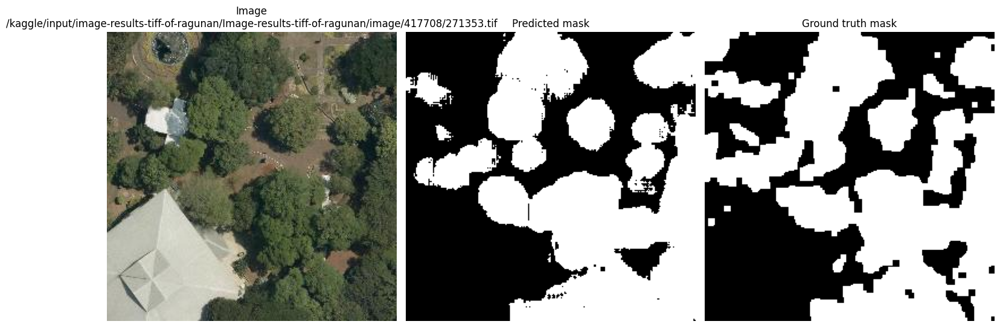

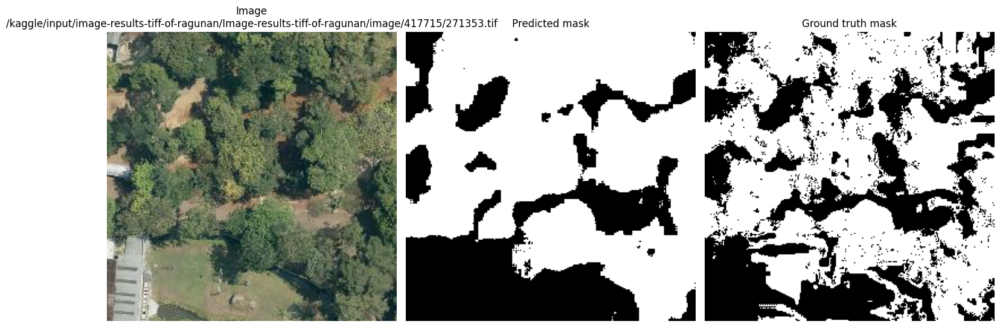

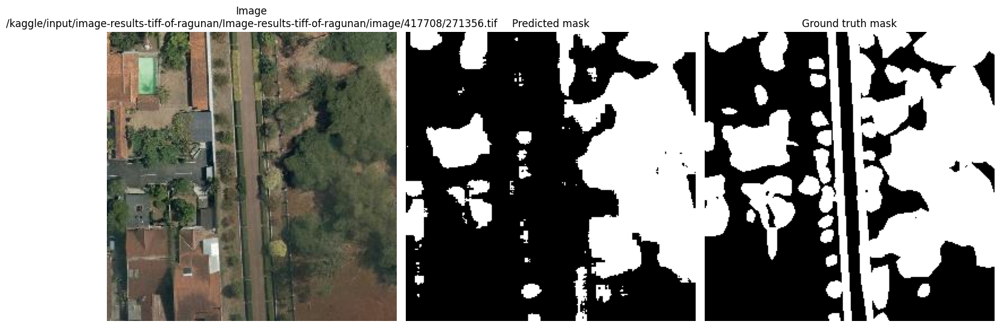

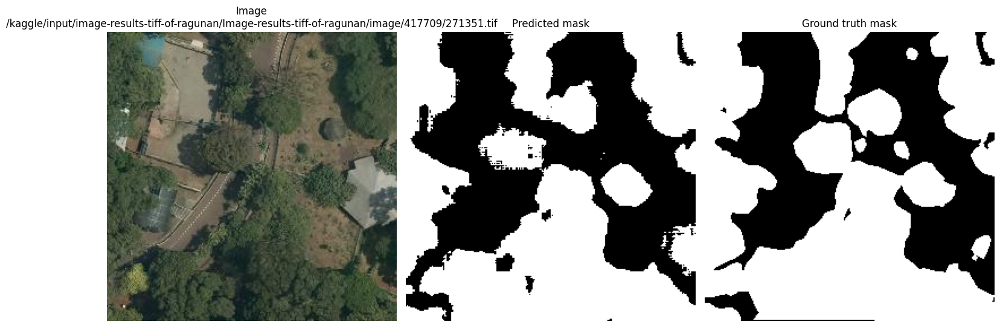

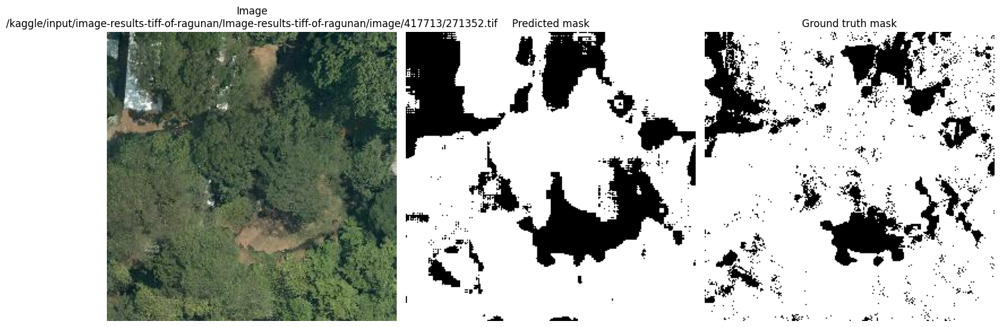

...

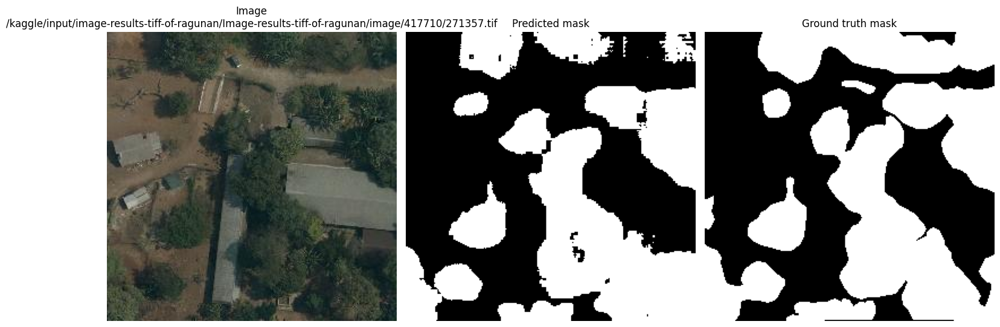

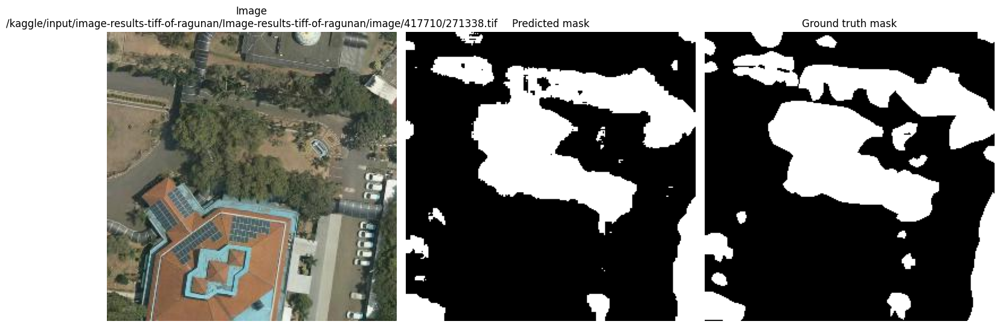

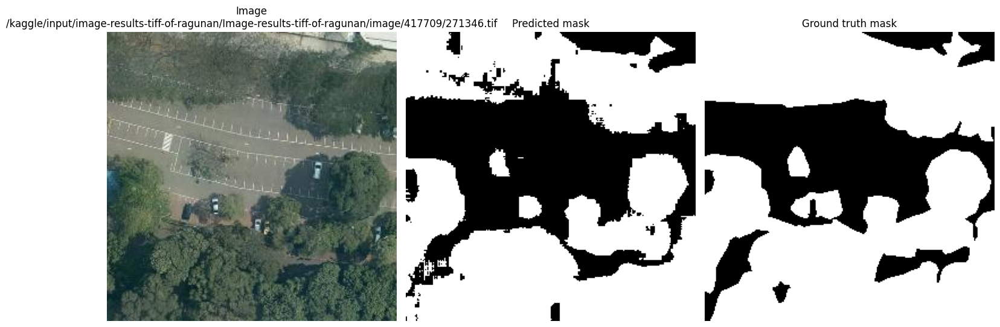

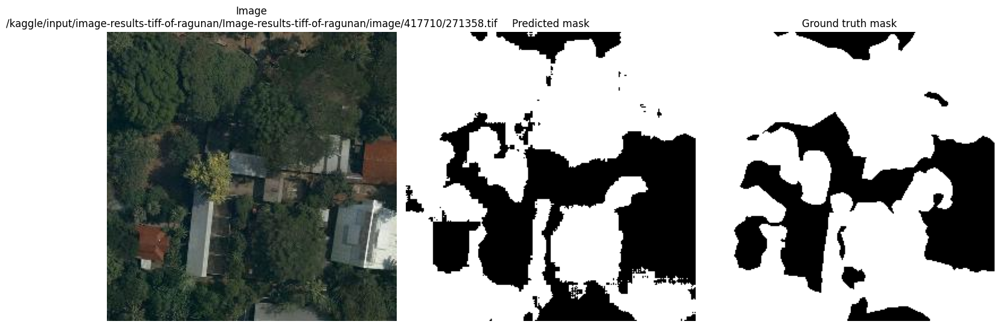

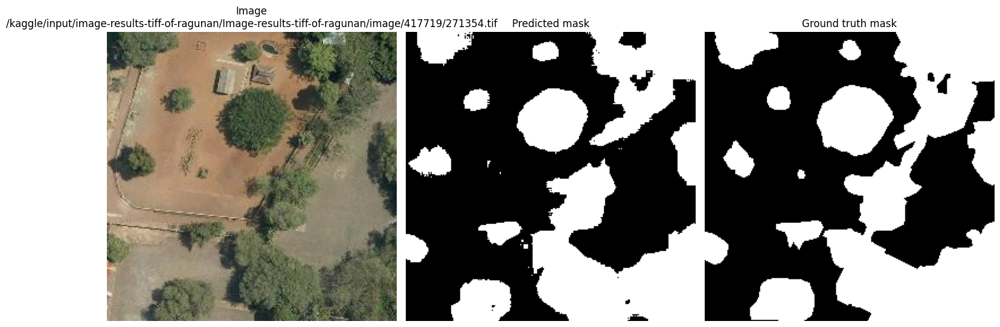

In [37]:
bin_masks = []
gt_masks = []
image_paths = []

for image, mask, image_path, mask_path in test_loader:
    for i in range(len(image_path)): 
        with rasterio.open(image_path[i]) as src:
            img = src.read([1, 2, 3])
            img = np.transpose(img, (1, 2, 0)) 

        gt_mask = cv2.imread(mask_path[i], cv2.IMREAD_GRAYSCALE)

        predictor_fine_tune.set_image(img)

        point = ref_point(gt_mask) 
        if len(point) == 0:
            print(f"No ref points in {mask_path[i]}")
            continue
            
        label = np.ones(len(point), dtype = np.int32)

        masks_fine_tune, scores, logits = predictor_fine_tune.predict(
            point_coords = point, point_labels = label, multimask_output = True
        )

        best_mask = masks_fine_tune[np.argmax(masks_fine_tune.sum(axis = (1, 2)))]
        best_mask = np.clip(best_mask, 0, 1)
        best_mask = (best_mask * 255).astype(np.uint8)

        _, bin_mask = cv2.threshold(best_mask, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

        gt_masks.append(gt_mask)
        bin_masks.append(bin_mask)
        image_paths.append(image_path[i])

        plt.figure(figsize = (15, 8))
        plt.subplot(1, 3, 1)
        plt.imshow(img)
        plt.title(f"Image\n{image_path[i]}")
        plt.axis("off")
    
        plt.subplot(1, 3, 2)
        plt.imshow(bin_mask, cmap = "gray")
        plt.title("Predicted mask")
        plt.axis("off")
    
        plt.subplot(1, 3, 3)
        plt.imshow(gt_mask, cmap = "gray")
        plt.title("Ground truth mask")
        plt.axis("off")
    
        plt.tight_layout()
        plt.show()

In [38]:
iou_score = []
total_area = []
images_data = []

for i, img_path in enumerate(image_paths):
    with rasterio.open(img_path) as src:
        GSD_x, GSD_y = src.res

    bin_mask = bin_masks[i]
    gt_mask = gt_masks[i]

    pixels = np.sum(bin_mask > 0)
    veg_area = pixels * (GSD_x * GSD_y)

    iou = calculate_iou(bin_mask, gt_mask)

    print(f"Image {img_path}")
    print(f"GSD x: {GSD_x}")
    print(f"GSD y: {GSD_y}")
    print(f"Pixels: {pixels}")
    print(f"Vegetation coverage area: {veg_area}")
    print(f"IoU score: {iou}")
    print("=========================")

    iou_score.append(iou)
    total_area.append(veg_area)

    images_data.append({
        "img_path": img_path,
        "veg_area": veg_area
    })

print("===========================")
print(f"Average IoU score: {np.mean(iou_score)}")
print(f"Total vegetation coverage area: {np.sum(total_area)}")

Image /kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan/image/417708/271353.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 32245
Vegetation coverage area: 18148.450543070525
IoU score: 0.77344
Image /kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan/image/417715/271353.tif
GSD x: 0.29544780320713926
GSD y: 0.263017456683479
Pixels: 42955
Vegetation coverage area: 3337.9441237970977
IoU score: 0.7379773766140754
Image /kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan/image/417708/271356.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 23017
Vegetation coverage area: 12954.656106368562
IoU score: 0.6269661582459485
Image /kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan/image/417709/271351.tif
GSD x: 1.9488129761920163
GSD y: 0.2888065298342284
Pixels: 35571
Vegetation coverage area: 20020.422833541998
IoU score: 0.8151788353532368
Image /kaggle/input/image-resul

In [51]:
veg_areas = []
carbon_stocks = []

predicted_carbon = 1761.7253514097679

total_veg_area = sum(i["veg_area"] for i in images_data)
carbon_density = predicted_carbon / total_veg_area

for i in images_data:
    carbon_stock = i["veg_area"] * carbon_density
    veg_areas.append(i["veg_area"])
    carbon_stocks.append(carbon_stock)

    print(f"Image {i['img_path']}")
    print(f"Vegetation coverage area: {i['veg_area']} m^2")
    print(f"Carbon density: {carbon_density} ton/m^2")
    print(f"Estimated carbon stock: {carbon_stock} ton")
    print("================================================")

print("================================================")
print(f"Total vegetation coverage area: {total_veg_area} m^2")
print(f"Total carbon density: {carbon_density} ton/m^2")
print(f"Total estimated carbon stock: {sum(carbon_stocks)} ton")

Image /kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan/image/417708/271353.tif
Vegetation coverage area: 18148.450543070525 m^2
Carbon density: 0.008190474545360872 ton/m^2
Estimated carbon stock: 148.64442221075984 ton
Image /kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan/image/417715/271353.tif
Vegetation coverage area: 3337.9441237970977 m^2
Carbon density: 0.008190474545360872 ton/m^2
Estimated carbon stock: 27.33934637979703 ton
Image /kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan/image/417708/271356.tif
Vegetation coverage area: 12954.656106368562 m^2
Carbon density: 0.008190474545360872 ton/m^2
Estimated carbon stock: 106.1047810831155 ton
Image /kaggle/input/image-results-tiff-of-ragunan/Image-results-tiff-of-ragunan/image/417709/271351.tif
Vegetation coverage area: 20020.422833541998 m^2
Carbon density: 0.008190474545360872 ton/m^2
Estimated carbon stock: 163.97676360548732 ton
Image /kaggle/input/im